In [1]:
#All libraries needed
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import geopandas as gpd
import shapely
import folium
import contextily
from collections import defaultdict
import branca
from folium import plugins
import webbrowser

In [2]:
#Reading in dataset
df = pd.read_csv("la_crime_2010_to_2023.csv")

In [39]:
#Seeing df info
df.shape
df.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON,AREA
0,1307355,02/20/2010 12:00:00 AM,02/20/2010 12:00:00 AM,1350,13.0,Newton,1385,2,900,VIOLATION OF COURT ORDER,...,Adult Arrest,900.0,NaN,NaN,NaN,300 E GAGE AV,NaN,33.9825,-118.2695,NaN
1,11401303,09/13/2010 12:00:00 AM,09/12/2010 12:00:00 AM,45,14.0,Pacific,1485,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",...,Invest Cont,740.0,NaN,NaN,NaN,SEPULVEDA BL,MANCHESTER AV,33.9599,-118.3962,NaN
2,70309629,08/09/2010 12:00:00 AM,08/09/2010 12:00:00 AM,1515,13.0,Newton,1324,2,946,OTHER MISCELLANEOUS CRIME,...,Invest Cont,946.0,NaN,NaN,NaN,1300 E 21ST ST,NaN,34.0224,-118.2524,NaN
3,90631215,01/05/2010 12:00:00 AM,01/05/2010 12:00:00 AM,150,6.0,Hollywood,646,2,900,VIOLATION OF COURT ORDER,...,Invest Cont,900.0,998.0,NaN,NaN,CAHUENGA BL,HOLLYWOOD BL,34.1016,-118.3295,NaN
4,100100501,01/03/2010 12:00:00 AM,01/02/2010 12:00:00 AM,2100,1.0,Central,176,1,122,"RAPE, ATTEMPTED",...,Invest Cont,122.0,NaN,NaN,NaN,8TH ST,SAN PEDRO ST,34.0387,-118.2488,NaN


In [40]:
#Cleaning for data where coordinates are null (0), ~1% of entries
print(df[df["LAT"]==0].shape)
print(df[df["LON"]==0].shape)
df = df[df["LAT"]!=0]

(3481, 29)
(3481, 29)


In [11]:
#Turning coordinates into geometry points for full dataset
'''
lon = df["LON"]
lat = df["LAT"]
geometry = [shapely.geometry.Point(xy) for xy in zip(lon,lat)]
geo_df = gpd.GeoDataFrame(geometry = geometry)
'''


In [41]:
#Plotting 2.9 million points and making folium maps is quite intensive so took a random sample of 500k
df_plot = df.sample(500000)

In [42]:
#Extracted lat and lon data
lat_plot = df_plot["LAT"]
lon_plot = df_plot["LON"]

In [43]:
#Zipped together lat and lon for a coordinate point.
geometry_plot = [shapely.geometry.Point(xy) for xy in zip(lon_plot,lat_plot)]
geo_df_plot = gpd.GeoDataFrame(geometry = geometry_plot)

In [47]:
#Creating the map and adding the points
map_plot = folium.Map(location=[34.07772709899999, -118.45796597400001], tiles='cartodbpositron', zoom_start=10.5, )

heat_data_plot = [[point.xy[1][0], point.xy[0][0]] for point in geo_df_plot.geometry]

#Creating and adding the color gradient bar
steps=20
colormap = branca.colormap.linear.YlOrRd_09.scale(0, 1).to_step(steps)
gradient_map=defaultdict(dict)
for i in range(steps):
    gradient_map[1/steps*i] = colormap.rgb_hex_str(1/steps*i)
colormap.add_to(map_plot) #add color bar at the top of the map

#Adding the heat gradient too points.
plugins.HeatMap(heat_data_plot,gradient=gradient_map,min_opacity=0.05, 
                max_opacity=0.75, 
                radius=8, blur = 3).add_to(map_plot)



#Saving the plot as html 
file_path = r"testwhat.html"
map_plot.save(file_path)

#Deploying the map
map_plot

(array([  3.,  43., 149., 176., 189., 138., 120.,  74.,  46.,  30.,  12.,
          9.,   6.,   2.,   1.,   1.,   0.,   0.,   0.,   1.]),
 array([ 50. ,  63.1,  76.2,  89.3, 102.4, 115.5, 128.6, 141.7, 154.8,
        167.9, 181. , 194.1, 207.2, 220.3, 233.4, 246.5, 259.6, 272.7,
        285.8, 298.9, 312. ]),
 <BarContainer object of 20 artists>)

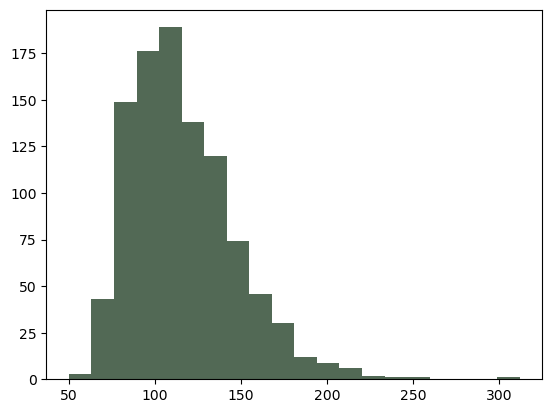

In [48]:
import numpy as np

def simulate_hands_for_one_player_to_see_all_cards(num_simulations=1000, num_players=8):
    deck = np.arange(52)  # Representing cards as numbers 0-51
    total_deals = []

    for _ in range(num_simulations):
        seen_cards = np.zeros(52, dtype=bool)
        deals = 0

        while not np.all(seen_cards):
            np.random.shuffle(deck)
            player_hand = deck[:2]  # First two cards of the shuffled deck (one player's hand)

            # Mark these cards as seen
            seen_cards[player_hand] = True
            deals += 1

        total_deals.append(deals)

    average_deals = np.mean(total_deals)
    return total_deals

# Run the simulation
average_deals = simulate_hands_for_one_player_to_see_all_cards()
plt.hist(average_deals,20, color = "#526955")